# <span style="color: #00ab9c">Part 1:</span> Classifying News Articles

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import gensim



In [2]:
pip install nltk


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.1.6_1/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/grant/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
pip install gensim


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.1.6_1/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


## EDA

<div style="background-color: rgba(52, 201, 235, 0.2)">
**Rubric**
    
Extracting word features and show Exploratory Data Analysis (EDA) — Inspect, Visualize and Clean the Data (15 pts)

Show a few visualizations like histograms. Describe any data cleaning procedures. Based on your EDA, what is your plan of analysis? 

Please feel free to look at online resources on processing raw texts to feature vectors. Many methods process texts to matrix form (word embedding), including TF-IDF, GloVe, Word2Vec, etc. Pick a method and process the raw texts to word embedding. Briefly explain the method(s) and how they work in your own words. Also, do exploratory data analysis such as word statistics and/or visualization.

As we did not learn natural language processing (NLP) specific techniques such as word embeddings in the lectures, we recommend reading discussions and example codes from others in the Kaggle and/or doing some research online to make sure you understand. You can refer to any resource as needed, but make sure you “demonstrate” your understanding- please include explaining in your own words, discussions, and your interpretation. Also importantly, please have a reference list at the end of the report. 
</div>

In [285]:
data = pd.read_csv('data/BBC News Train.csv')
bbc_test = pd.read_csv('data/BBC News Test.csv')

In [143]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1490 entries, 0 to 1489
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ArticleId  1490 non-null   int64 
 1   Text       1490 non-null   object
 2   Category   1490 non-null   object
dtypes: int64(1), object(2)
memory usage: 35.1+ KB
None


In [6]:
print(data.head())

   ArticleId                                               Text  Category
0       1833  worldcom ex-boss launches defence lawyers defe...  business
1        154  german business confidence slides german busin...  business
2       1101  bbc poll indicates economic gloom citizens in ...  business
3       1976  lifestyle  governs mobile choice  faster  bett...      tech
4        917  enron bosses in $168m payout eighteen former e...  business


Next, I'll look for and clean up any missing and duplicated values.

In [7]:
print(f'Missing values: {data.isnull().sum()}')

Missing values: ArticleId    0
Text         0
Category     0
dtype: int64


In [8]:
print(f'Duplicated values: {data.duplicated().sum()}')

Duplicated values: 0


In [9]:
print(data.describe(include=['object']))

                                                     Text Category
count                                                1490     1490
unique                                               1440        5
top     microsoft seeking spyware trojan microsoft is ...    sport
freq                                                    2      346


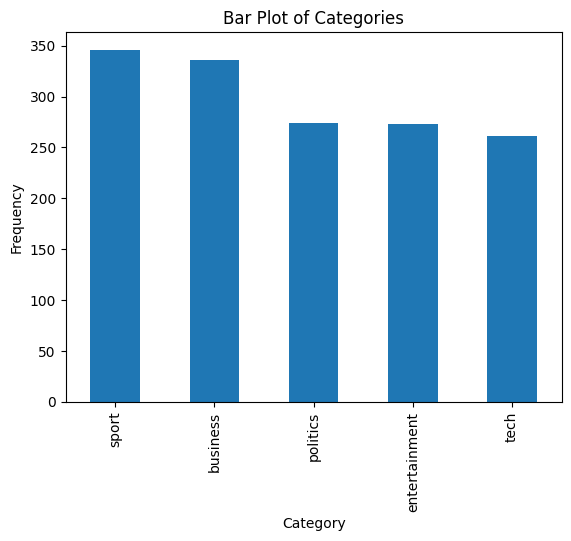

In [10]:
data['Category'].value_counts().plot(kind='bar')
plt.title('Bar Plot of Categories')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.show()

We can see that the frequency of documents in a given category is more skewed toward sport and business with those frequencies being similar and the frequency of articles related to politics, entertainment, and tech being similar.

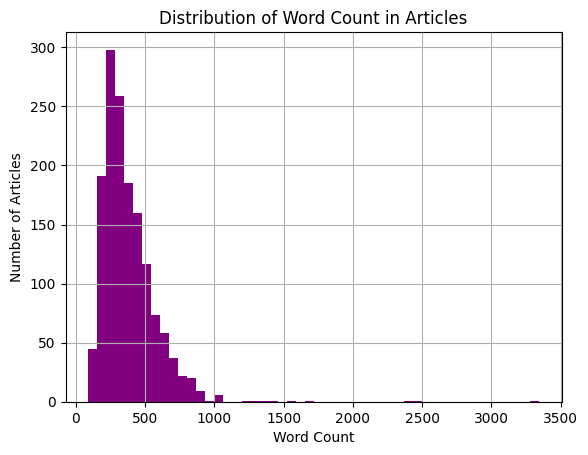

In [11]:
eda_copy = data.copy()
eda_copy['word_count'] = eda_copy['Text'].apply(lambda x: len(x.split()))
eda_copy['word_count'].hist(bins=50, color='purple')
plt.title('Distribution of Word Count in Articles')
plt.xlabel('Word Count')
plt.ylabel('Number of Articles')
plt.show()

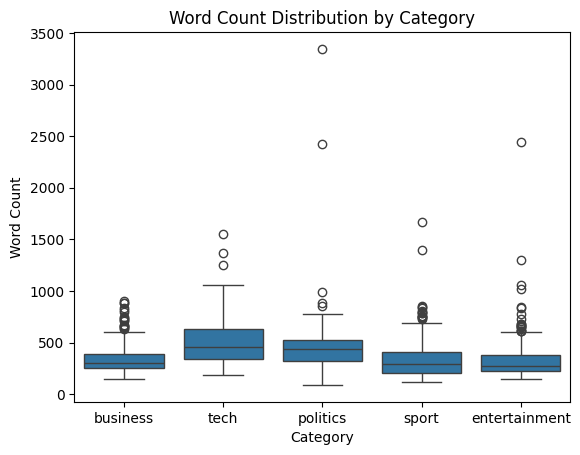

In [12]:
sns.boxplot(x='Category', y='word_count', data=eda_copy)
plt.title('Word Count Distribution by Category')
plt.xlabel('Category')
plt.ylabel('Word Count')
plt.show()

Politics and tech seem to have a slightly larger number of words.

### Term Frequency-Inverse Document Frequency (TF-IDF)

TF-IDF is similar to but not exactly word embedding. It helps understand the importance of a word relative to a collection of texts. It's a function of the frequency/importance of a word in a single document and the frequency/importance of that word in all documents in the collection.

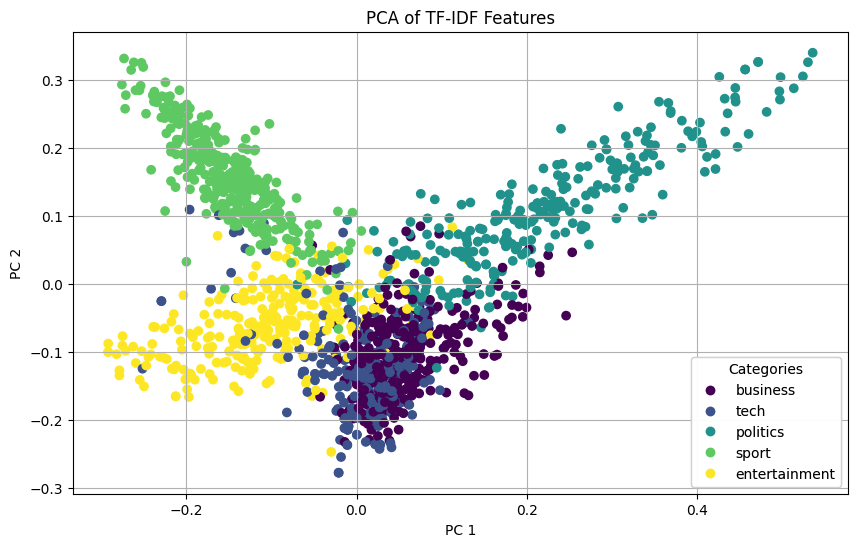

In [13]:
# I used a combination of generative AI and videos to help understand word embedding and compose the following code.

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(data['Text'])

pca = PCA(n_components=2)
pcs = pca.fit_transform(X.toarray())

category_labels, unique_categories = pd.factorize(data['Category'])

plt.figure(figsize=(10, 6))
scatter = plt.scatter(pcs[:, 0], pcs[:, 1], c=pd.factorize(data['Category'])[0], cmap='viridis')

handles, _ = scatter.legend_elements()
legend1 = plt.legend(handles, unique_categories, title="Categories")
plt.gca().add_artist(legend1)

plt.title('PCA of TF-IDF Features')
plt.xlabel('PC 1')
plt.ylabel('PC 2')

plt.grid(True)
plt.show()

### Word Embedding

Word embedding helps us understand the relationships between words. They help in NLP tasks for finding the next word in a sentence and sentimant analysis.

I found the visualization of the word vectors from our data intruiging. I was fascinating to see what words ended up near eachother. For example: storage, cameras, and movies were near eachother, and not too far away were songs and producers. 

In [286]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

from gensim.models import Word2Vec

def preprocess(text):
    tokens = word_tokenize(text.lower())
    tokens = [word for word in tokens if word.isalpha()]
    tokens = [word for word in tokens if word not in stopwords.words('english')]
    return tokens

processed_texts = [preprocess(doc) for doc in data['Text']]

model = Word2Vec(sentences=processed_texts, vector_size=100, window=5, min_count=1, workers=4)
model.save("word2vec.model")

In [38]:
# exploring finding similar sample words
model = Word2Vec.load("word2vec.model")
vector = model.wv['movies']
similar_words = model.wv.most_similar('movies', topn=5)
print(similar_words)

[('images', 0.9990695118904114), ('shows', 0.9990504384040833), ('different', 0.9990279078483582), ('gadget', 0.9990118145942688), ('device', 0.9989652633666992)]


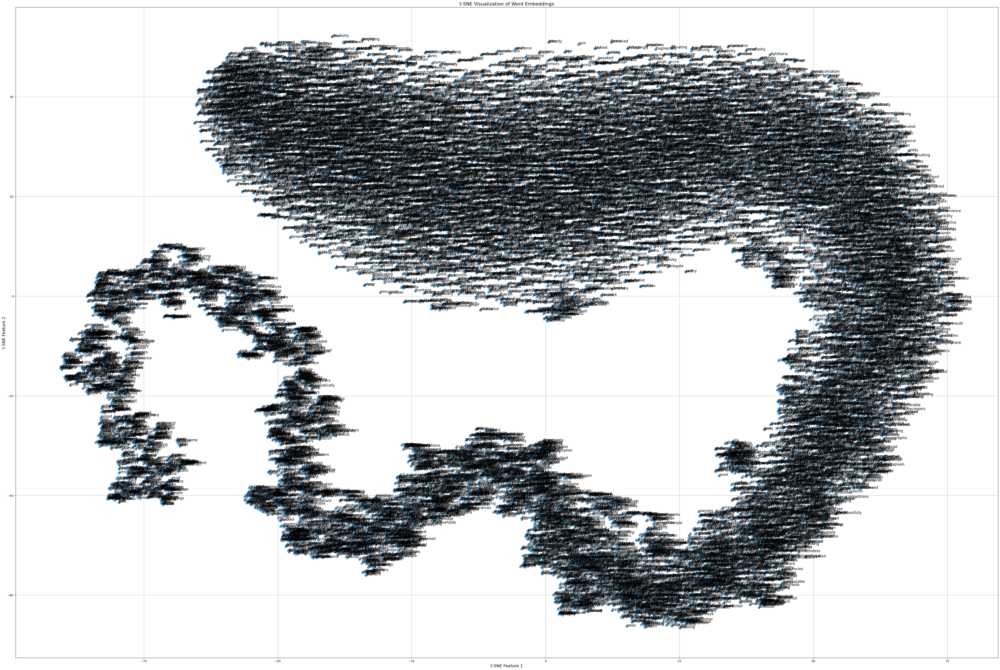

In [356]:
from sklearn.manifold import TSNE

words = list(model.wv.index_to_key)
word_vectors = np.array([model.wv[word] for word in words])

tsne = TSNE(n_components=2, random_state=0)
word_vectors_2d = tsne.fit_transform(word_vectors)


plt.figure(figsize=(60, 40))
plt.scatter(word_vectors_2d[:, 0], word_vectors_2d[:, 1], alpha=0.7, edgecolors='w', s=100)

for i, word in enumerate(words):
    plt.annotate(word, (word_vectors_2d[i, 0], word_vectors_2d[i, 1]), fontsize=12)

plt.title('t-SNE Visualization of Word Embeddings', fontsize=16)
plt.xlabel('t-SNE Feature 1', fontsize=14)
plt.ylabel('t-SNE Feature 2', fontsize=14)
plt.grid(True)
plt.show()

# you can zoom into the following image that visualizes relationships between words. Figure size can be adjusted, but I shrunk it down for better sharing

## Model Building & Training

*When you train the unsupervised model for matrix factorization, should you include texts (word features) from the test dataset or not as the input matrix? Why or why not?*

I should not include texts from the test dataset as the input matrix when training the unsupervised model. Including those would cause the model to learn patterns in the test set leading to an overestimation of its performance and overfitting. The model might not react well to additional unseen data.

In [278]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix

In [318]:
train, test = train_test_split(data, test_size=0.2, random_state=40)

In [319]:
def run_and_eval_nmf(n_feat, verbose=False):
    vectorizer = TfidfVectorizer(stop_words='english', max_features=n_feat)
    X_train = vectorizer.fit_transform(train['Text'])
    
    num_topics = 5
    nmf = NMF(n_components=num_topics, random_state=40, max_iter=1000)
    
    W_train = nmf.fit_transform(X_train)
    H = nmf.components_
    
    X_test = vectorizer.transform(test['Text'])
    W_test = nmf.transform(X_test)
    
    terms = vectorizer.get_feature_names_out()
    if verbose:
        for index, topic in enumerate(H):
            print(f"Topic {index+1}:")
            print(" ".join([terms[i] for i in topic.argsort()[:-6:-1]]))
        
    # mapping topic to category
    topic_to_category = {
        0: "business",
        1: "sport",
        2: "entertainment",
        3: "politics",
        4: "tech"
    }
    
    W_test_topic_indices = W_test.argmax(axis=1)
    pred_cats = [topic_to_category[i] for i in W_test_topic_indices]
    
    actual_cats = test['Category'].values
    
    acc = accuracy_score(actual_cats, pred_cats)

    if verbose:
        print(f'Accuracy: {acc:.4f}')
        
        conf_matrix = confusion_matrix(actual_cats, pred_cats, labels=list(topic_to_category.values()))
        
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                    xticklabels=list(topic_to_category.values()), yticklabels=list(topic_to_category.values()))
        plt.xlabel('Predicted Categories')
        plt.ylabel('Actual Categories')
        plt.show()
        
    return acc, nmf.reconstruction_err_

Topic 1:
said year firm market company
Topic 2:
game england win time second
Topic 3:
film best won year years
Topic 4:
mr government labour election said
Topic 5:
people music new 000 uk
Accuracy: 0.6611


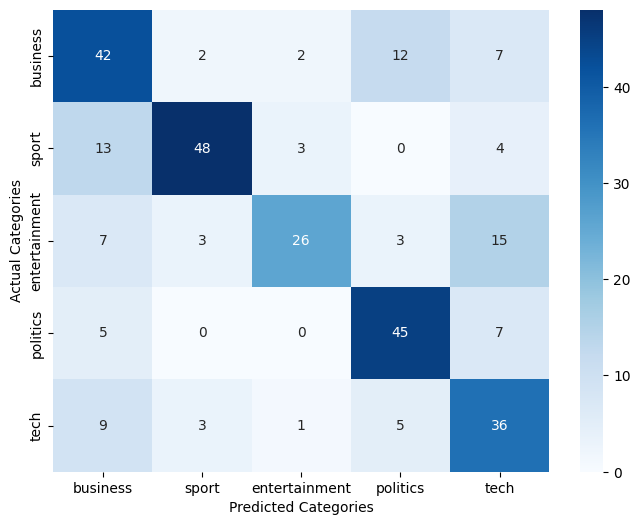

(0.6610738255033557, 26.43154917757471)

In [320]:
run_and_eval_nmf(40, True)

## Improving model performance

In [321]:
outcome = {}
errors = {}

n_features = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400]

for n in n_features:
    acc, recon_err = run_and_eval_nmf(n, False)
    outcome[n] = acc
    errors[n] = recon_err

print(dict(sorted(outcome.items(), key=lambda item: item[1], reverse=True)))


{120: 0.802013422818792, 130: 0.7986577181208053, 110: 0.7953020134228188, 90: 0.761744966442953, 100: 0.761744966442953, 80: 0.7416107382550335, 70: 0.738255033557047, 60: 0.7281879194630873, 50: 0.6912751677852349, 40: 0.6610738255033557, 290: 0.5335570469798657, 260: 0.5302013422818792, 270: 0.5302013422818792, 280: 0.5302013422818792, 300: 0.5302013422818792, 320: 0.5268456375838926, 330: 0.5234899328859061, 340: 0.5201342281879194, 160: 0.4563758389261745, 150: 0.44966442953020136, 170: 0.44966442953020136, 140: 0.4463087248322148, 310: 0.36577181208053694, 390: 0.36577181208053694, 250: 0.3624161073825503, 350: 0.3624161073825503, 360: 0.3624161073825503, 370: 0.3624161073825503, 380: 0.3624161073825503, 400: 0.3624161073825503, 230: 0.35570469798657717, 240: 0.35570469798657717, 210: 0.3523489932885906, 200: 0.348993288590604, 220: 0.348993288590604, 190: 0.34563758389261745, 180: 0.33557046979865773, 30: 0.21476510067114093, 10: 0.12751677852348994, 20: 0.0738255033557047}


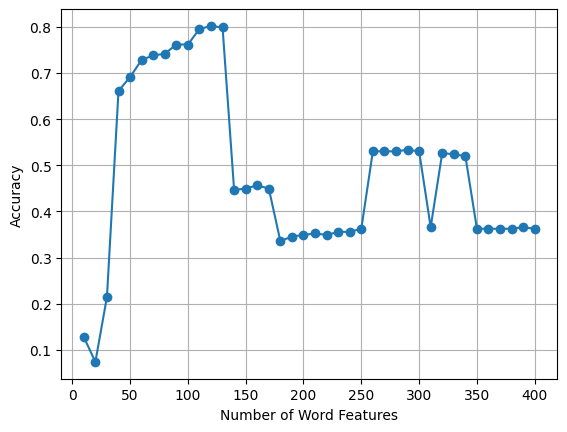

In [322]:
accs = list(outcome.values())

plt.plot(n_features, accs, marker='o')
plt.xlabel('Number of Word Features')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

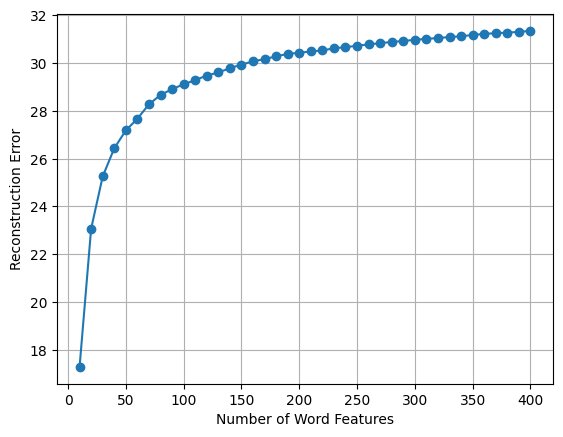

In [323]:
errs = list(errors.values())

plt.plot(n_features, errs, marker='o')
plt.xlabel('Number of Word Features')
plt.ylabel('Reconstruction Error')
plt.grid(True)
plt.show()

**Based on the elbow and overlaying visualizations, I've determined 120 is the best number of features to use.**

Topic 1:
said year company market firm
Topic 2:
game england win team play
Topic 3:
film best director won tv
Topic 4:
mr said labour blair election
Topic 5:
people software users music said
Accuracy: 0.8020


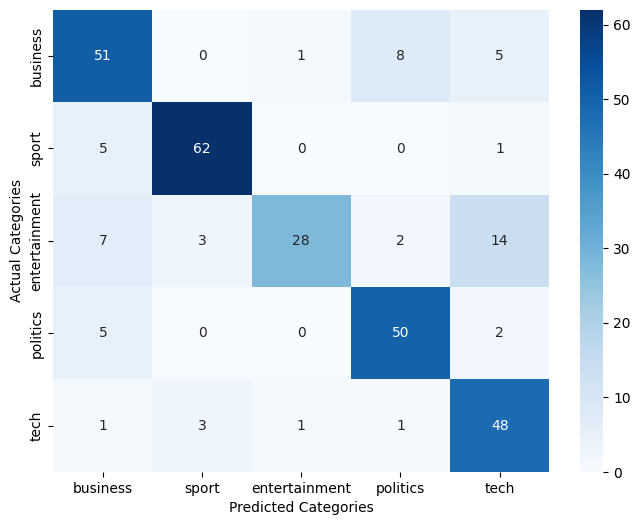

(0.802013422818792, 29.47233063941388)

In [329]:
run_and_eval_nmf(120, True)

### Performance of different extraction methods

In [325]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, HashingVectorizer


def evaluate_nmf(vectorizer):
    X_train = vectorizer.fit_transform(train['Text'])
    nmf = NMF(n_components=5, random_state=40, max_iter=1000)
    W_train = nmf.fit_transform(X_train)
    return nmf.reconstruction_err_

num_feat = 130

feature_methods = {
    'TF-IDF': TfidfVectorizer(stop_words='english', max_features=num_feat),
    'Count': CountVectorizer(stop_words='english', max_features=num_feat),
    'Hashing': HashingVectorizer(stop_words='english', n_features=num_feat, alternate_sign=False)
}

# Evaluate each method
errors = {}

print('Reconstruction errors')
for name, vectorizer in feature_methods.items():
    error = evaluate_nmf(vectorizer)
    errors[name] = error
    print(f"{name}: {error:.4f}")


Reconstruction errors
TF-IDF: 29.6015
Count: 298.8974
Hashing: 24.4609


HashingVectorizer has a slightly lower reconstruction error than TfidfVectorizer and far lower than CountVectorizer. However, due to the smaller size of our dataset and the importance of interpretability (especially as an initial exploration into NMF), I think that TF-IDF is a better route for me during this project.

## Run model on Kaggle Test Data

In [338]:
kaggle_vectorizer = TfidfVectorizer(stop_words='english', max_features=120)

# using full text from train dataset this time, because we have a seperate test dataset
X_train = kaggle_vectorizer.fit_transform(data['Text'])

nmf = NMF(n_components=5, random_state=40)

W_train = nmf.fit_transform(X_train)
H = nmf.components_

# using bbc_test as test data
X_test = kaggle_vectorizer.transform(bbc_test['Text'])
W_test = nmf.transform(X_test)

terms = kaggle_vectorizer.get_feature_names_out()

for index, topic in enumerate(H):
    print(f"Topic {index+1}:")
    print(" ".join([terms[i] for i in topic.argsort()[:-10:-1]]))
    


Topic 1:
said year company firm market 2004 growth sales new
Topic 2:
mr labour said blair election party government minister brown
Topic 3:
film best director won tv year british including number
Topic 4:
game england win players play team time said games
Topic 5:
people software users said music mobile technology use phone


In [339]:
# mapping topic to category
topic_to_category = {
    0: "business",
    1: "politics",
    2: "entertainment",
    3: "sport",
    4: "tech"
}

W_test_topic_indices = W_test.argmax(axis=1)
pred_cats = [topic_to_category[i] for i in W_test_topic_indices]

bbc_test['Category'] = pred_cats

print(bbc_test.head())

df_output = bbc_test[['ArticleId', 'Category']]

df_output.to_csv('predictions.csv', index=False)


   ArticleId                                               Text  Category
0       1018  qpr keeper day heads for preston queens park r...  business
1       1319  software watching while you work software that...      tech
2       1138  d arcy injury adds to ireland woe gordon d arc...     sport
3        459  india s reliance family feud heats up the ongo...  business
4       1020  boro suffer morrison injury blow middlesbrough...     sport


*I submitted the results to the Kaggle competition.* My accuracy was **0.77278**.

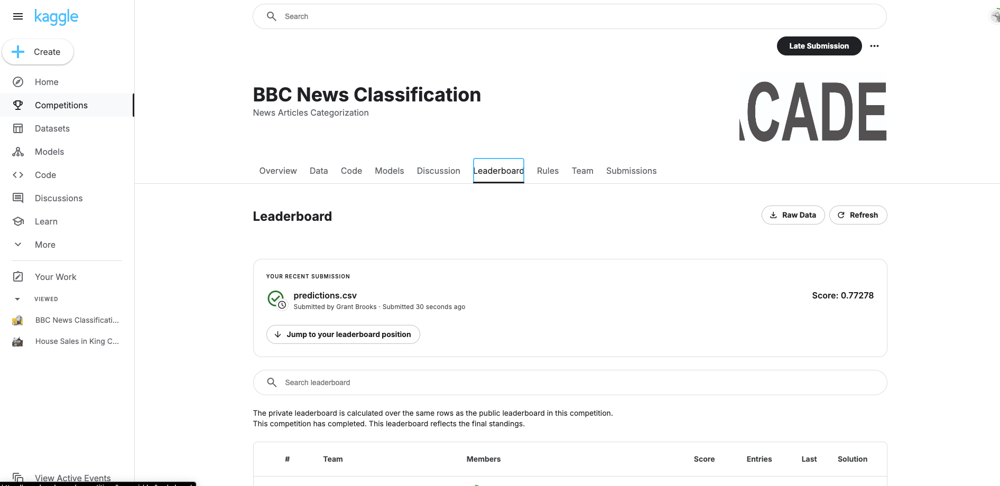

## Comparison with Supervised Learning

In [350]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

vectorizer = TfidfVectorizer(stop_words='english', max_features=130)
X = vectorizer.fit_transform(data['Text'])

X_train, X_test, y_train, y_test = train_test_split(X, data['Category'], test_size=0.2, random_state=40)
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")

Accuracy: 0.9396


### Trying different train/test sizes

In [349]:
test_sizes = [0.1, 0.2, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for size in test_sizes: 
    vectorizer = TfidfVectorizer(stop_words='english', max_features=120)
    X = vectorizer.fit_transform(data['Text'])
    X_train, X_test, y_train, y_test = train_test_split(X, data['Category'], test_size=size, random_state=40)
    
    svm = SVC(kernel='linear')
    svm.fit(X_train, y_train)
    y_pred = svm.predict(X_test)
    print(f"SVM test size: {size}; acc: {accuracy_score(y_test, y_pred):.4f}")

    nmf = NMF(n_components=5, random_state=40, max_iter=1000)
    W_train = nmf.fit_transform(X_train)
    print(f"NMF test size: {size}; recon_err: {nmf.reconstruction_err_:.4f}")
    


SVM test size: 0.1; acc: 0.9530
NMF test size: 0.1; recon_err: 31.2128
SVM test size: 0.2; acc: 0.9564
NMF test size: 0.2; recon_err: 29.4438
SVM test size: 0.4; acc: 0.9094
NMF test size: 0.4; recon_err: 25.5217
SVM test size: 0.5; acc: 0.9087
NMF test size: 0.5; recon_err: 23.2629
SVM test size: 0.6; acc: 0.9027
NMF test size: 0.6; recon_err: 20.8443
SVM test size: 0.7; acc: 0.8936
NMF test size: 0.7; recon_err: 18.0044
SVM test size: 0.8; acc: 0.8658
NMF test size: 0.8; recon_err: 14.7166
SVM test size: 0.9; acc: 0.8434
NMF test size: 0.9; recon_err: 10.2900


As the test size increases, SVM performance improves initially, peaking at 0.8893 accuracy at a test size of 0.2. NMF's reconstruction error continues to decrease as the test size increases. This could be because the data is **overfitting** with smaller test sizes and as the size increases the overfitting decreases leading to a decrease in reconstruction arror.

SVC seems to outperform NMF while requiring smaller 

### Comparing the two using the same train small train size of 0.1

We can see below that SVM outperforms NMF with a small train size, indicating that it is more data efficient. NMF is likely less prone to overfitting because of the lower number of components and it handles higher number of features better than SVM.

In [353]:
vectorizer = TfidfVectorizer(stop_words='english', max_features=130)
X = vectorizer.fit_transform(data['Text'])
X_train, X_test, y_train, y_test = train_test_split(X, data['Category'], train_size=0.1, random_state=40)

svm = SVC(kernel='linear')
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)


nmf = NMF(n_components=5, random_state=40, max_iter=1000)
W_train = nmf.fit_transform(X_train)
H = nmf.components_
W_test = nmf.transform(X_test)

terms = vectorizer.get_feature_names_out()

for index, topic in enumerate(H):
    print(f"Topic {index+1}:")
    print(" ".join([terms[i] for i in topic.argsort()[:-10:-1]]))
    


Topic 1:
said mr people new company software music says plans
Topic 2:
game half players games play win team england time
Topic 3:
growth sales 2004 year economy economic market 2005 business
Topic 4:
best film british director year won final time including
Topic 5:
labour election blair mr government minister party public said


In [354]:
# mapping topic to category
topic_to_category = {
    0: "tech",
    1: "sport",
    2: "business",
    3: "entertainment",
    4: "politics"
}

W_test_topic_indices = W_test.argmax(axis=1)
pred_cats = [topic_to_category[i] for i in W_test_topic_indices]
# actual_cats = test['Category'].values
acc = accuracy_score(y_test, pred_cats)

print(f"SVM accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"NMF accuracy: {acc:.4f}")


SVM accuracy: 0.8531
NMF accuracy: 0.7159


## References

Word Embeddings: https://www.youtube.com/watch?v=gQddtTdmG_8